# Agri_EDA

# import

In [12]:
import sys
import warnings
warnings.filterwarnings('ignore')


import numpy as np
import pandas as pd
pd.options.display.float_format = '{:.3f}'.format
import matplotlib.pyplot as plt
import koreanize_matplotlib
%config InlineBackend.figure_format = 'retina'
import seaborn as sns


sys.path.append("../Import")
from modul import reduce_mem_usage, EDA
from definitions import crop_list3

root_path = "../"
data_path = f"{root_path}data/"

crop_list3 = [("마늘", "garlic"),("깻잎", "sesameLeaf"),("감자", "potato"),("고구마", "sweetPotato")]

# var
Product = "마늘"
Product_eng = "garlic"
# Product = crop_list3[3][0]
# Product_eng = crop_list3[3][1]

# 파일 불러오기

In [13]:
df_raw = pd.read_csv(f"{data_path}Agri_all.csv")
EDA.Check_df(df_raw)



┌▣ df.shape ---- ---- ---- ----
(15880, 18)


┌▣ df.info() ---- ---- ---- ----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15880 entries, 0 to 15879
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   YMD                      15880 non-null  object 
 1   YM                       15880 non-null  int64  
 2   MD                       15880 non-null  int64  
 3   Product                  15880 non-null  object 
 4   Price                    15880 non-null  float64
 5   KRW_USD_EXR              15880 non-null  float64
 6   Annual_Call_Rate         15880 non-null  float64
 7   item_PPI                 11910 non-null  float64
 8   item_CPI                 15880 non-null  float64
 9   Food_Price_Index         15880 non-null  float64
 10  Cereals_Price_Index      15880 non-null  float64
 11  DayAvg_Temperature       15880 non-null  float64
 12  DayDiff_Temperature      15880 non-null  float64


,YMD,YM,MD,Product,Price,KRW_USD_EXR,Annual_Call_Rate,item_PPI,item_CPI,Food_Price_Index,Cereals_Price_Index,DayAvg_Temperature,DayDiff_Temperature,DayAvg_RelativeHumidity,DaySum_Rainfall,DayAvg_WindSpeed,DaySum_Sunshine,Warning_Count
0,2005-01-03,200501,103,마늘,20785.714,1013.000,3.330,49.580,58.270,65.400,60.500,4.400,12.800,35.200,0.000,2.600,1.600,0.000
1,2005-01-04,200501,104,마늘,20785.714,1013.000,3.330,49.580,58.270,65.400,60.500,-0.200,8.800,26.000,0.000,2.800,2.800,0.000
2,2005-01-05,200501,105,마늘,20928.571,1013.000,3.330,49.580,58.270,65.400,60.500,-1.400,11.200,33.400,0.000,0.600,3.200,0.000
3,2005-01-06,200501,106,마늘,21071.429,1013.000,3.330,49.580,58.270,65.400,60.500,2.800,7.800,31.200,1.200,1.200,2.600,0.000
4,2005-01-07,200501,107,마늘,21071.429,1013.000,3.330,49.580,58.270,65.400,60.500,2.000,7.600,28.400,0.000,2.800,2.800,0.000




┌▣ df.columns.to_list() ---- ---- ---- ----
['YMD', 'YM', 'MD', 'Product', 'Price', 'KRW_USD_EXR', 'Annual_Call_Rate', 'item_PPI', 'item_CPI', 'Food_Price_Index', 'Cereals_Price_Index', 'DayAvg_Temperature', 'DayDiff_Temperature', 'DayAvg_RelativeHumidity', 'DaySum_Rainfall', 'DayAvg_WindSpeed', 'DaySum_Sunshine', 'Warning_Count']


In [14]:
# 분석할 데이터 할당
df = df_raw.copy()
df = reduce_mem_usage(df)
df['YMD'] = pd.to_datetime(df['YMD'])

eda = EDA(
    df,
    Product=Product,
    cheetkey = "Agri"
)

Mem. usage decreased to  0.79 Mb (63.9% reduction)


In [15]:
eda.Check_self()



┌▣ df.shape ---- ---- ---- ----
(3970, 18)


┌▣ df.info() ---- ---- ---- ----
<class 'pandas.core.frame.DataFrame'>
Int64Index: 3970 entries, 0 to 3969
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   YMD                      3970 non-null   datetime64[ns]
 1   YM                       3970 non-null   int32         
 2   MD                       3970 non-null   int16         
 3   Product                  3970 non-null   object        
 4   Price                    3970 non-null   float32       
 5   KRW_USD_EXR              3970 non-null   float16       
 6   Annual_Call_Rate         3970 non-null   float16       
 7   item_PPI                 3970 non-null   float16       
 8   item_CPI                 3970 non-null   float16       
 9   Food_Price_Index         3970 non-null   float16       
 10  Cereals_Price_Index      3970 non-null   float16       
 11  DayAvg_Temperat

,YMD,YM,MD,Product,Price,KRW_USD_EXR,Annual_Call_Rate,item_PPI,item_CPI,Food_Price_Index,Cereals_Price_Index,DayAvg_Temperature,DayDiff_Temperature,DayAvg_RelativeHumidity,DaySum_Rainfall,DayAvg_WindSpeed,DaySum_Sunshine,Warning_Count
0,2005-01-03,200501,103,마늘,20785.715,1013.000,3.330,49.594,58.281,65.375,60.500,4.398,12.797,35.188,0.000,2.600,1.600,0.000
1,2005-01-04,200501,104,마늘,20785.715,1013.000,3.330,49.594,58.281,65.375,60.500,-0.200,8.797,26.000,0.000,2.801,2.801,0.000
2,2005-01-05,200501,105,마늘,20928.572,1013.000,3.330,49.594,58.281,65.375,60.500,-1.400,11.203,33.406,0.000,0.600,3.199,0.000
3,2005-01-06,200501,106,마늘,21071.428,1013.000,3.330,49.594,58.281,65.375,60.500,2.801,7.801,31.203,1.200,1.200,2.600,0.000
4,2005-01-07,200501,107,마늘,21071.428,1013.000,3.330,49.594,58.281,65.375,60.500,2.000,7.602,28.406,0.000,2.801,2.801,0.000


# 단변량



┌▣ df.describe().T ---- ---- ---- ----


,count,mean,std,min,25%,50%,75%,max
YM,3970.000,201252.093,461.766,200501.000,200812.000,201211.500,201612.000,202012.000
MD,3970.000,668.678,344.341,102.000,402.000,703.000,1001.000,1231.000
Price,3970.000,37050.703,17609.014,11598.788,18493.334,37812.500,49300.000,73375.000
KRW_USD_EXR,3970.000,inf,89.000,929.500,1055.000,1139.000,1168.000,1258.000
Annual_Call_Rate,3970.000,2.529,1.214,0.700,1.590,2.340,3.330,4.781
item_PPI,3970.000,inf,34.469,36.312,49.438,78.875,113.750,150.250
item_CPI,3970.000,inf,25.453,55.969,62.594,90.562,115.125,149.000
Food_Price_Index,3970.000,inf,18.328,65.375,91.125,97.000,118.188,137.625
Cereals_Price_Index,3970.000,inf,24.781,59.406,90.500,98.688,124.375,163.250
DayAvg_Temperature,3970.000,13.258,9.195,-8.625,5.000,13.797,21.594,30.406




┌▣ df.describe(include=['O']) ---- ---- ---- ----


,Product
count,3970
unique,1
top,마늘
freq,3970




┌▣ df.isna().sum() ---- ---- ---- ----


,0
YMD,0
YM,0
MD,0
Product,0
Price,0
KRW_USD_EXR,0
Annual_Call_Rate,0
item_PPI,0
item_CPI,0
Food_Price_Index,0




┌▣ sns.heatmap(data=df.isna()) ---- ---- ---- ----


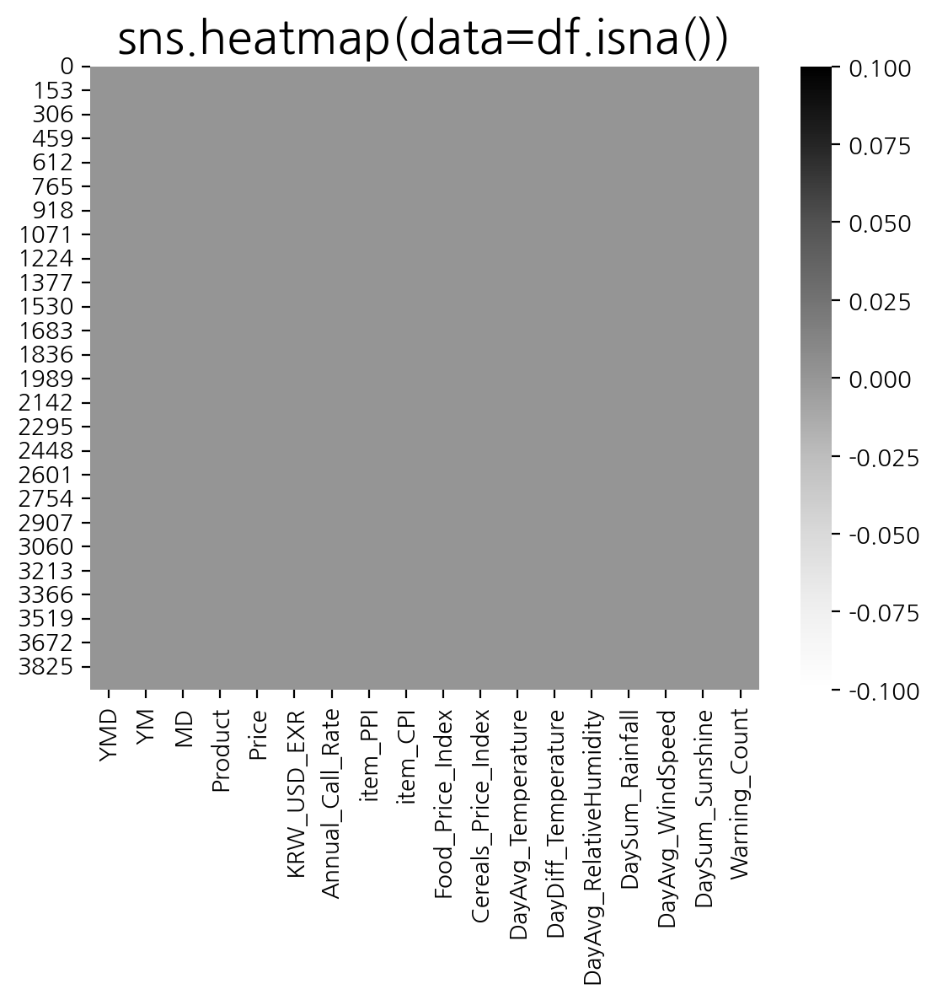



┌▣ df.isna().mean() ---- ---- ---- ----


,0
YMD,0.000
YM,0.000
MD,0.000
Product,0.000
Price,0.000
KRW_USD_EXR,0.000
Annual_Call_Rate,0.000
item_PPI,0.000
item_CPI,0.000
Food_Price_Index,0.000




┌▣ df.hist() ---- ---- ---- ----


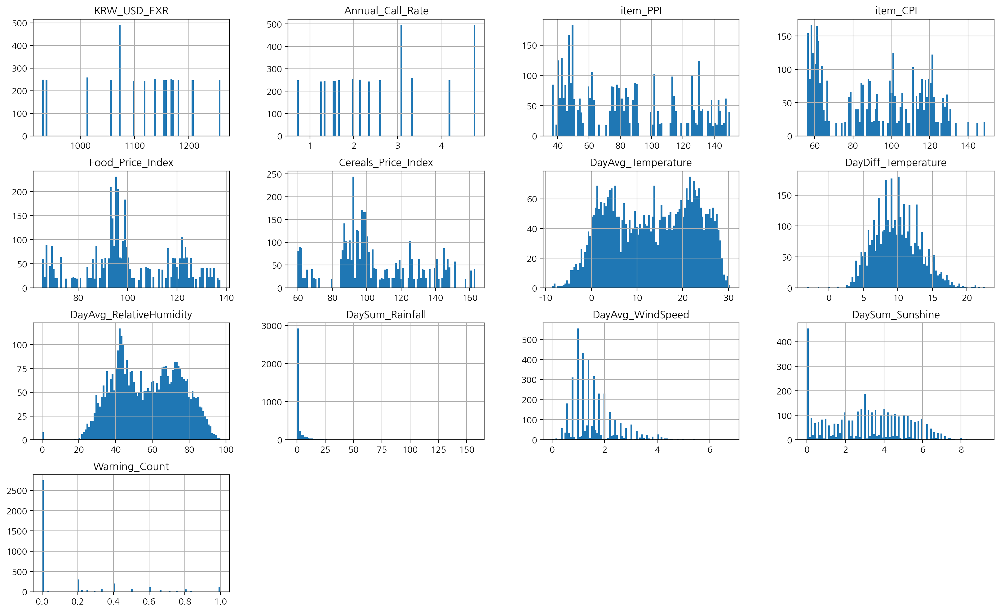



┌▣ df_log1p.hist() ---- ---- ---- ----


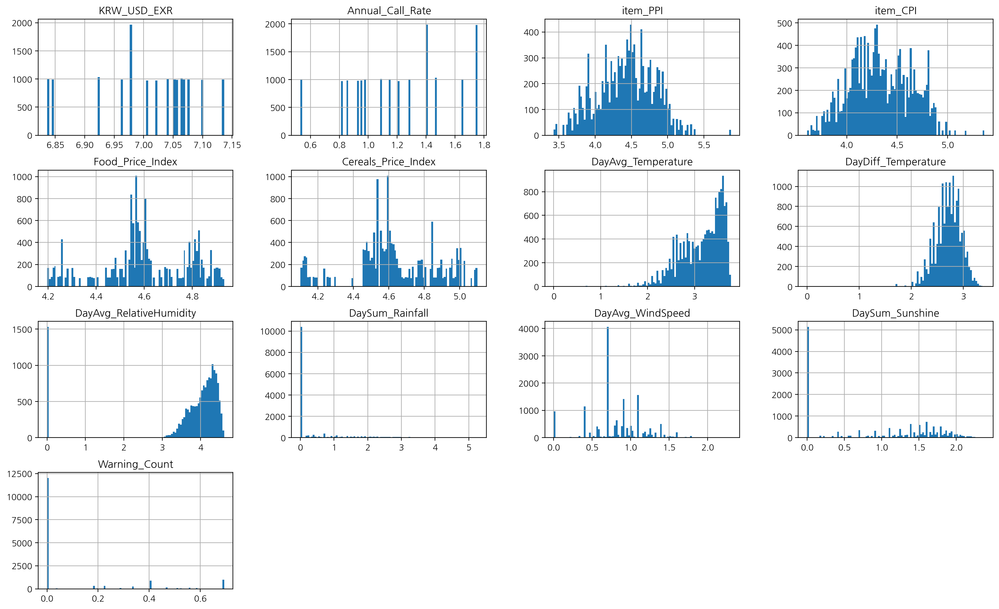



┌▣ df_log1p_robSc.hist() ---- ---- ---- ----


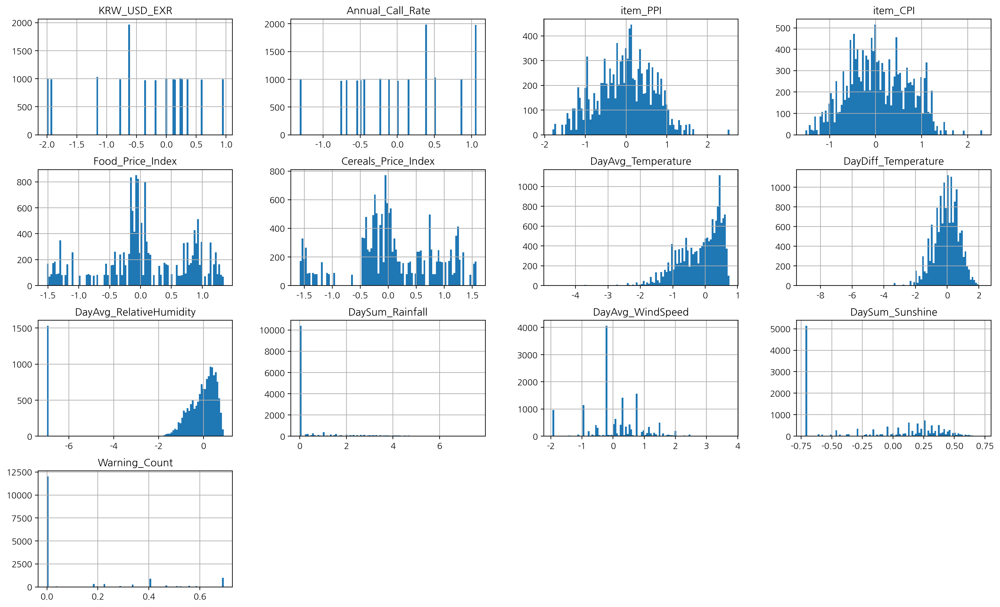

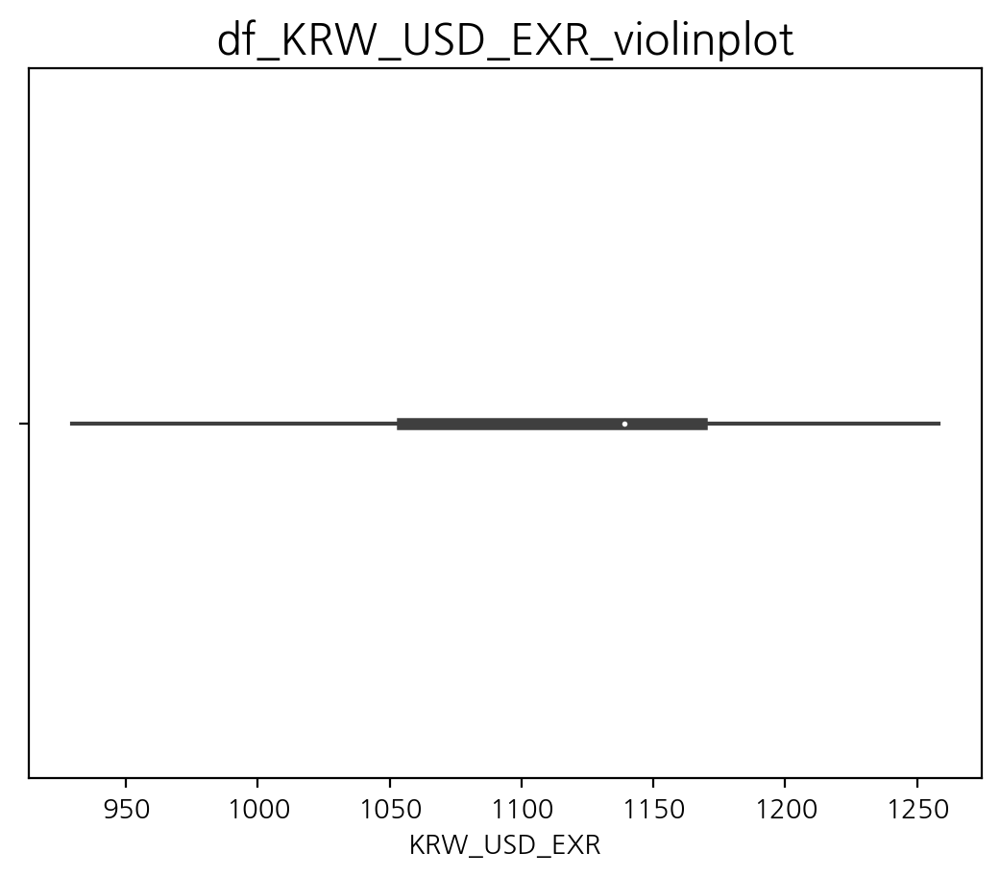

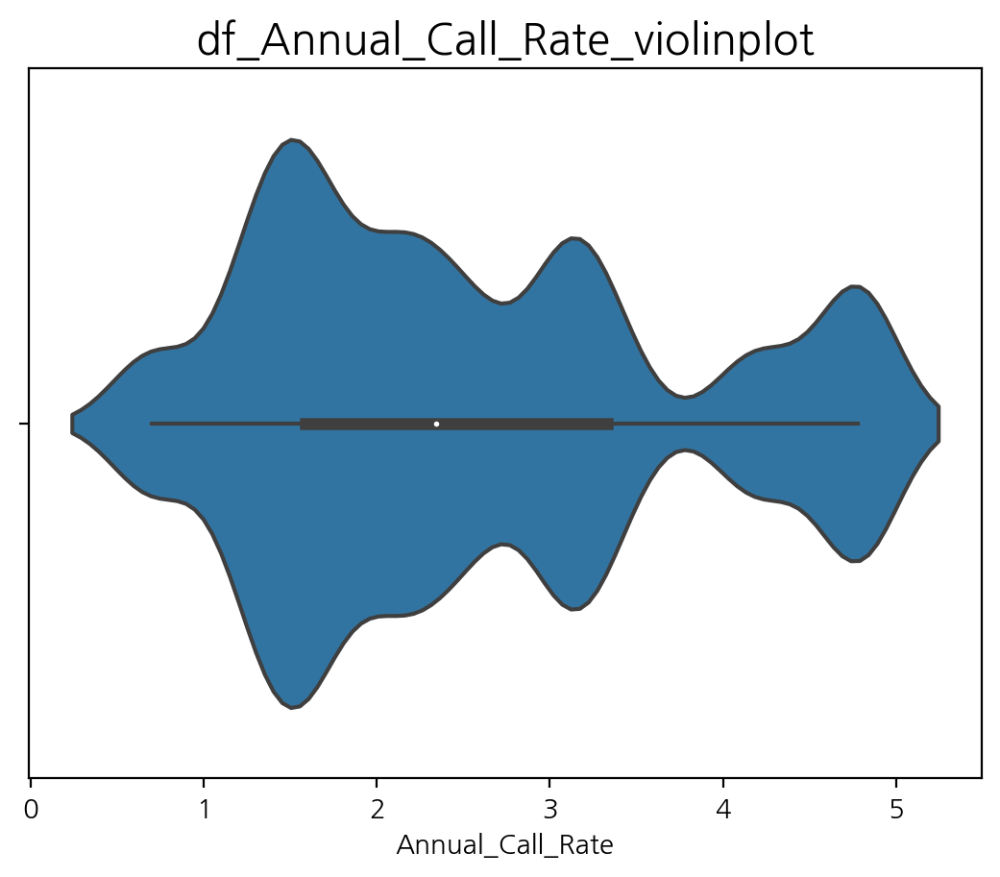

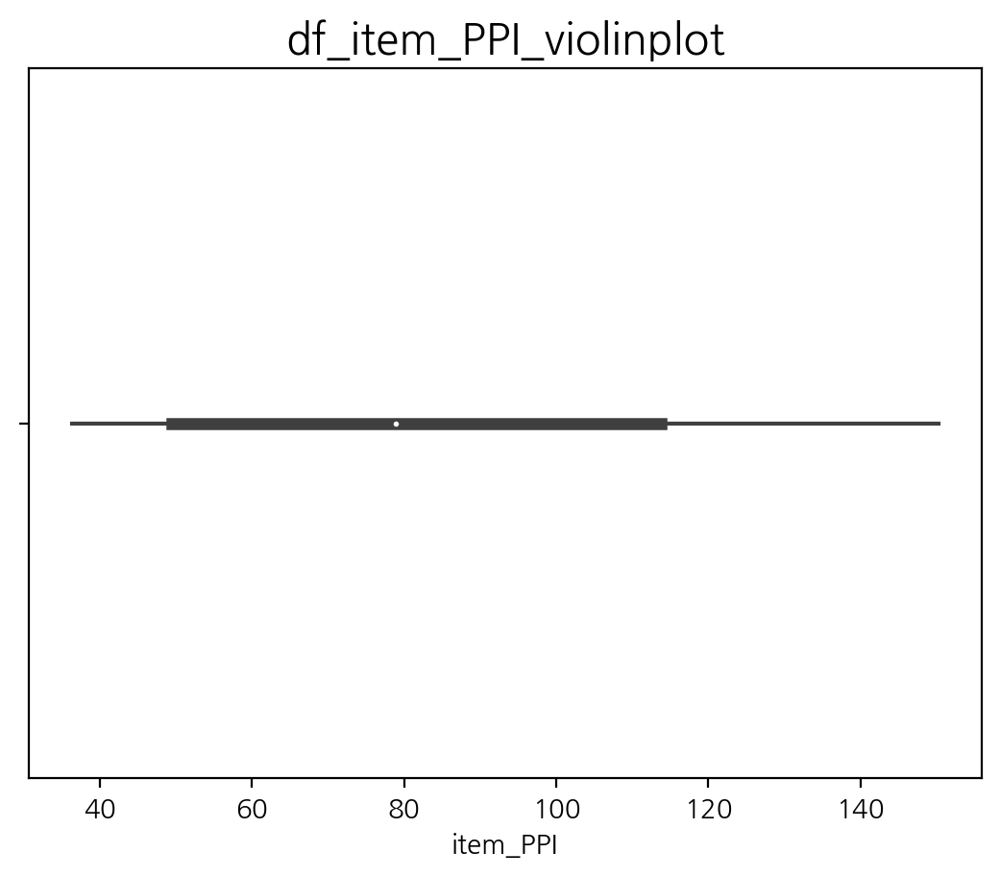

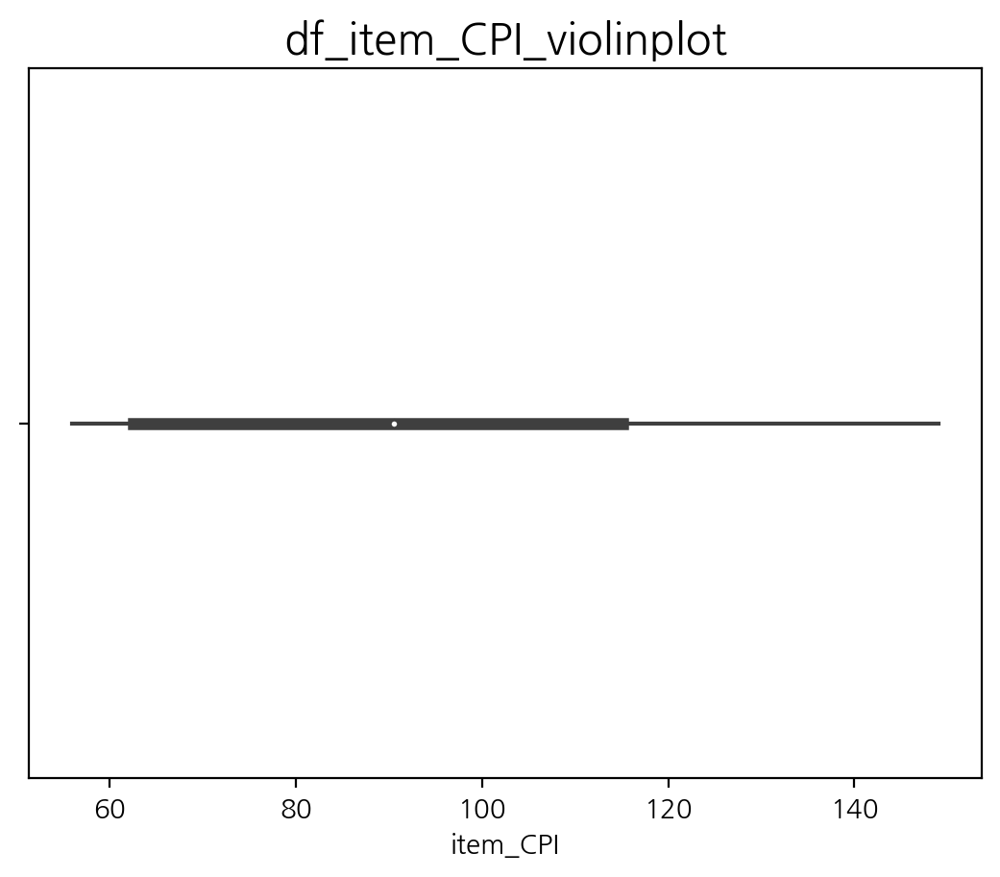

...

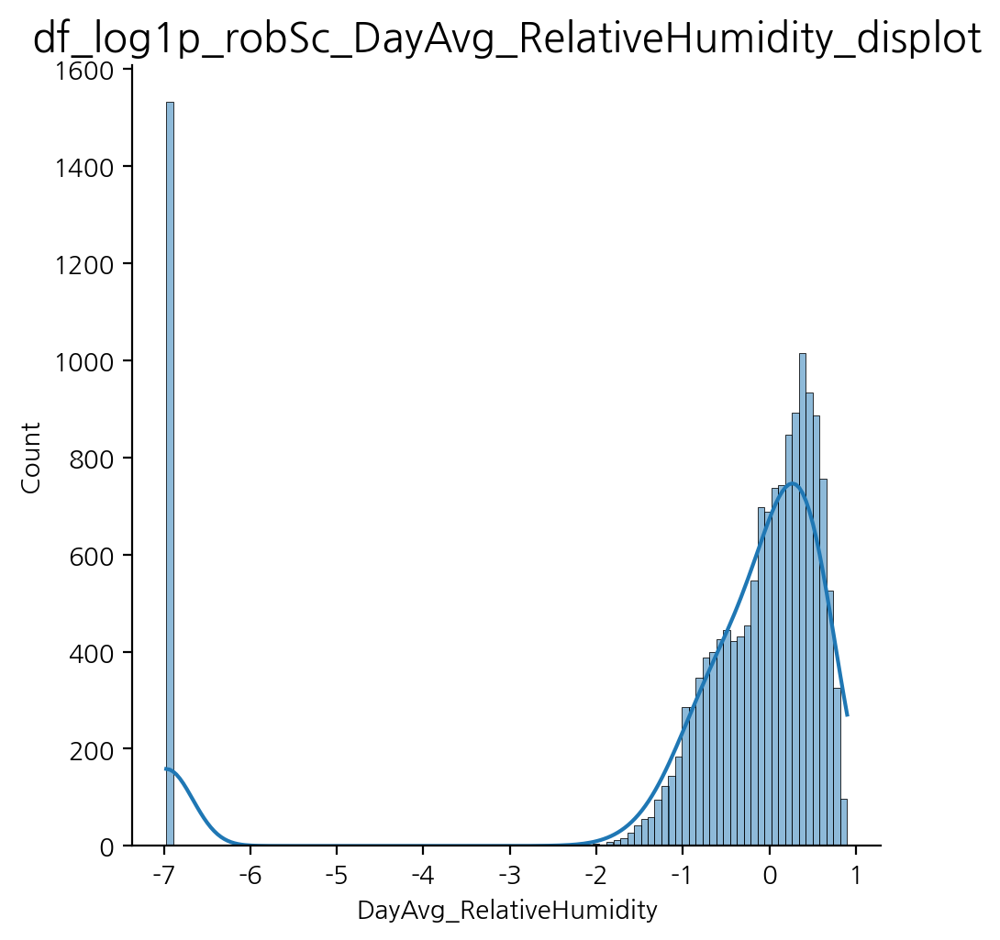

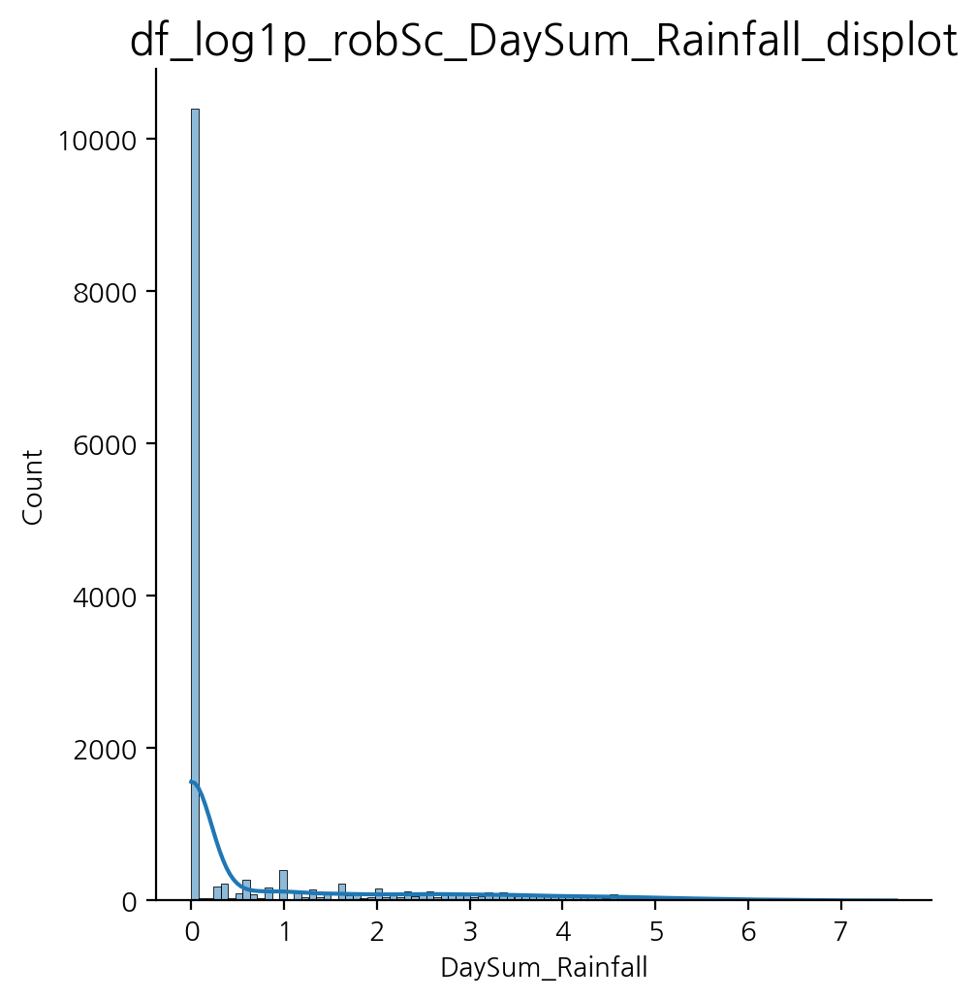

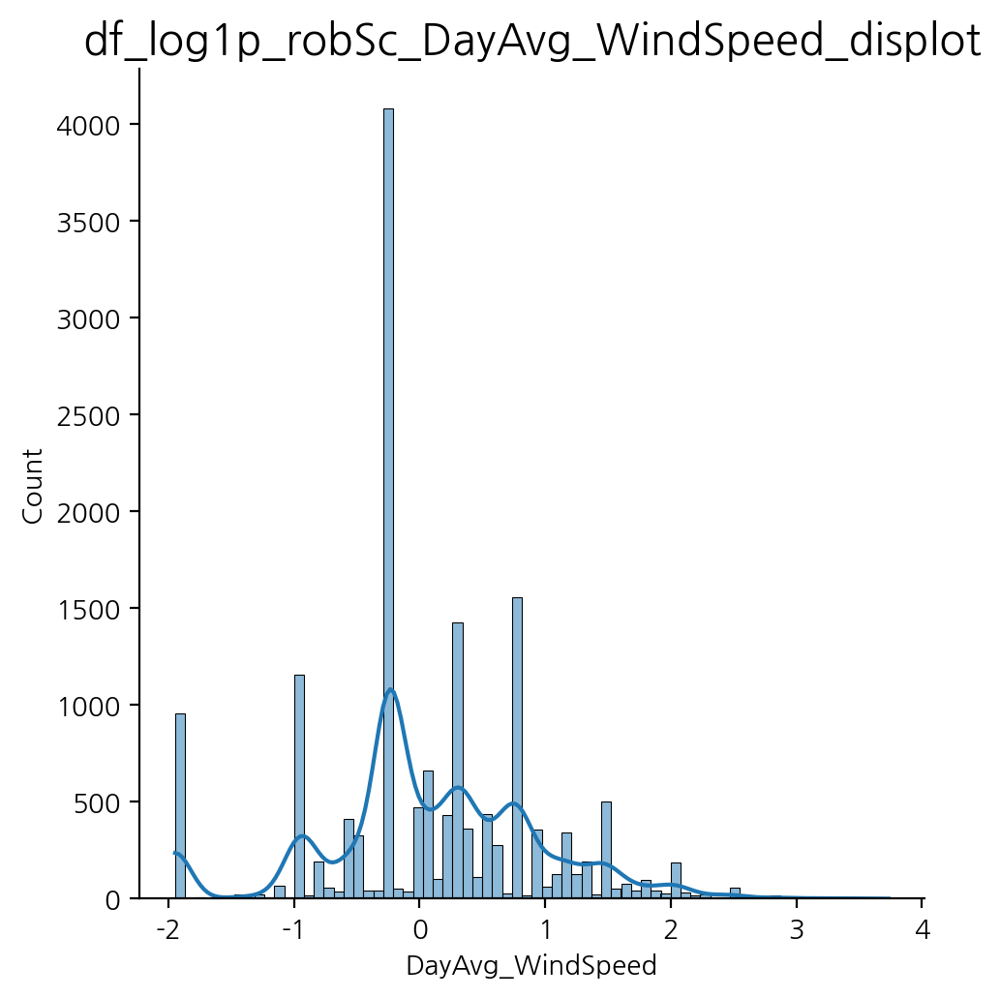

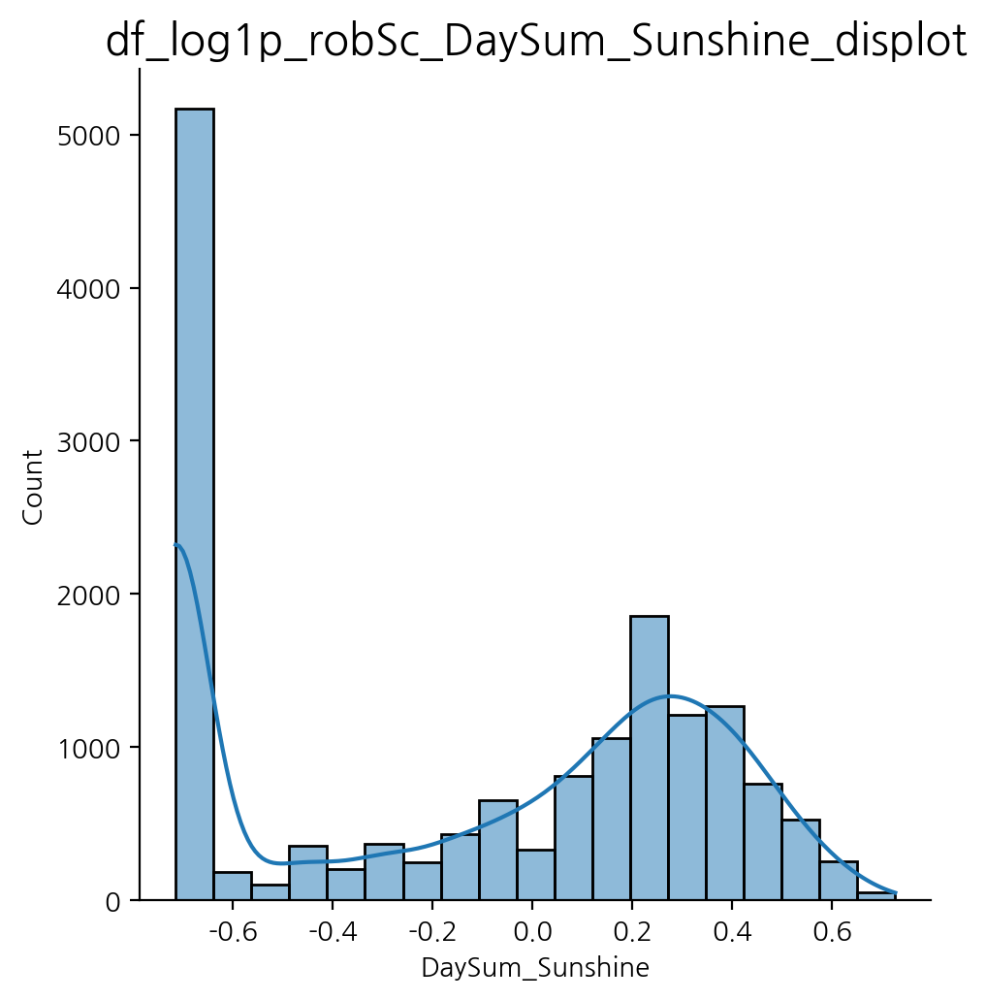

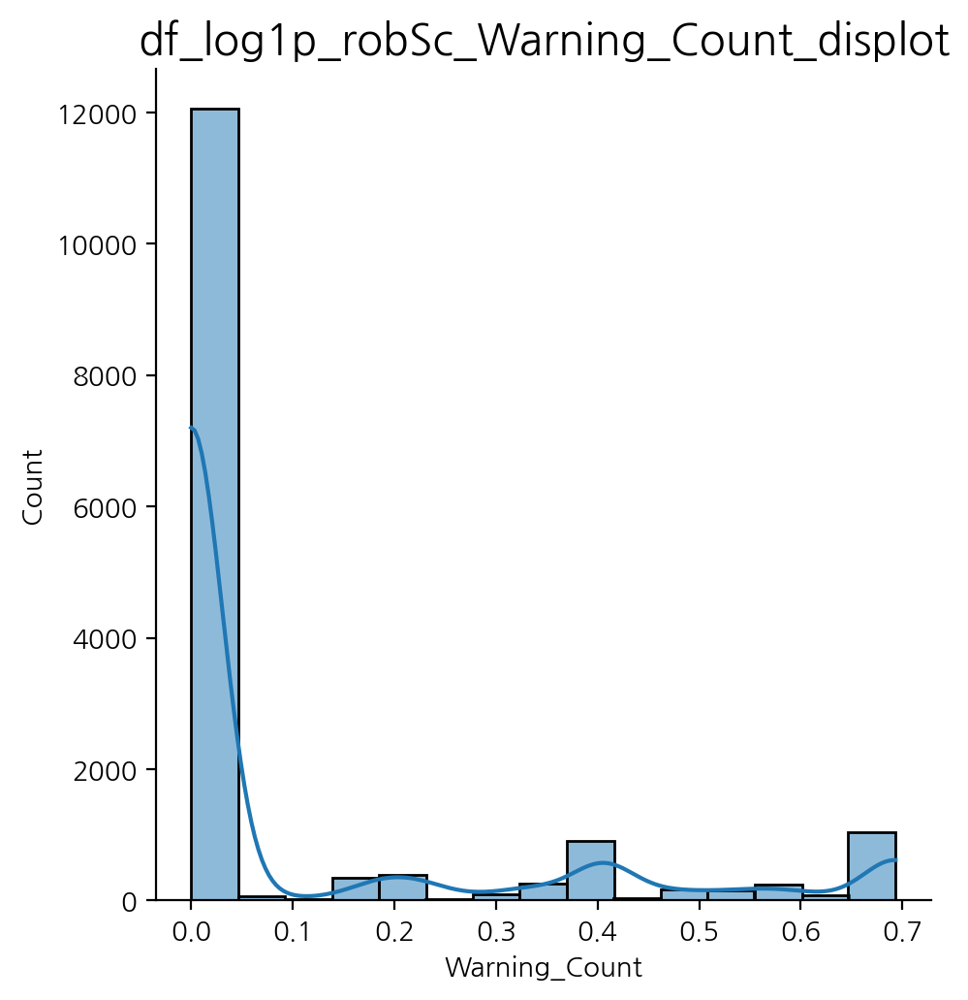

In [16]:
eda.uv()

## df.plot()

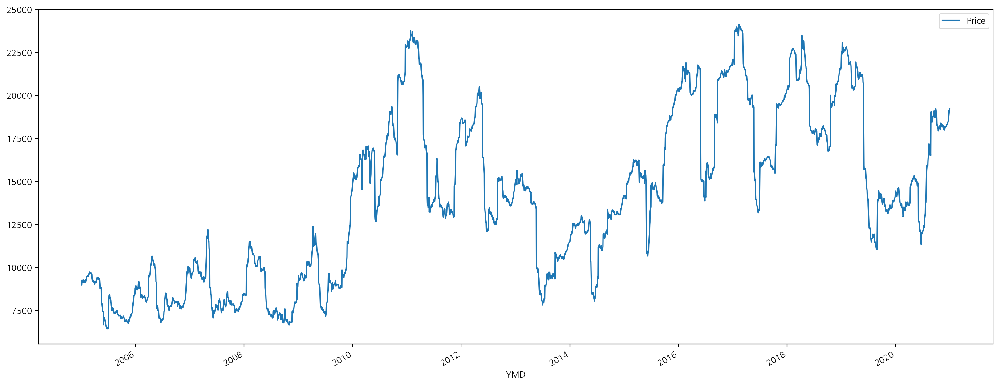

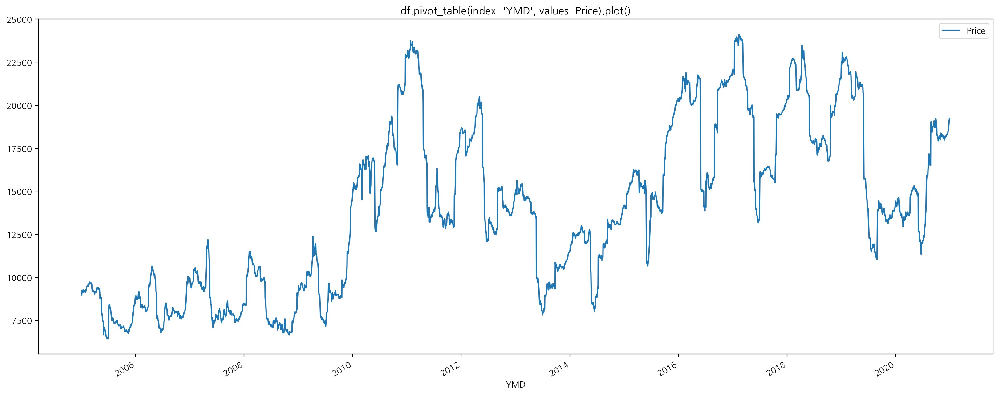

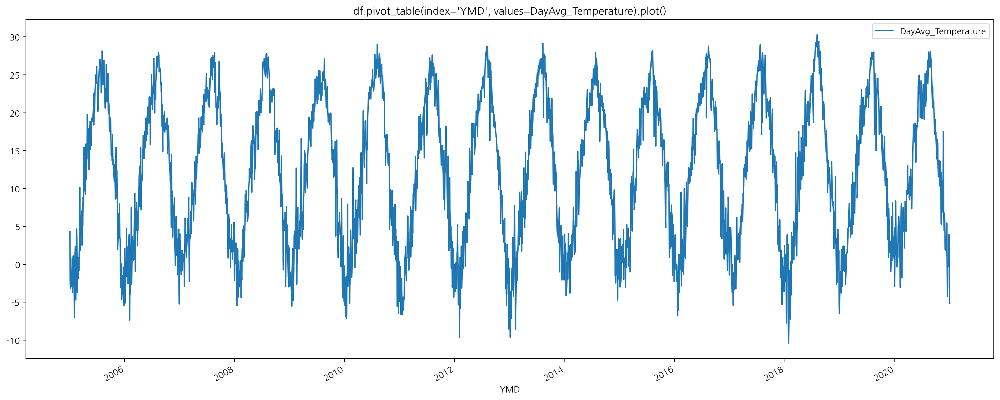

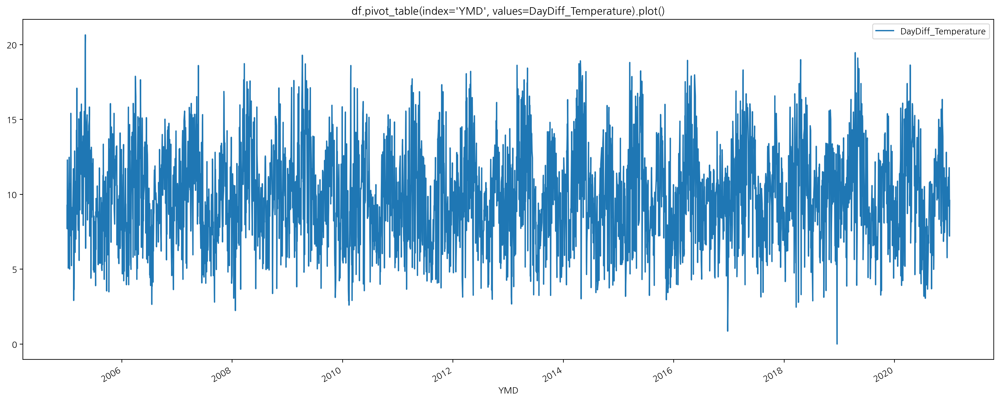

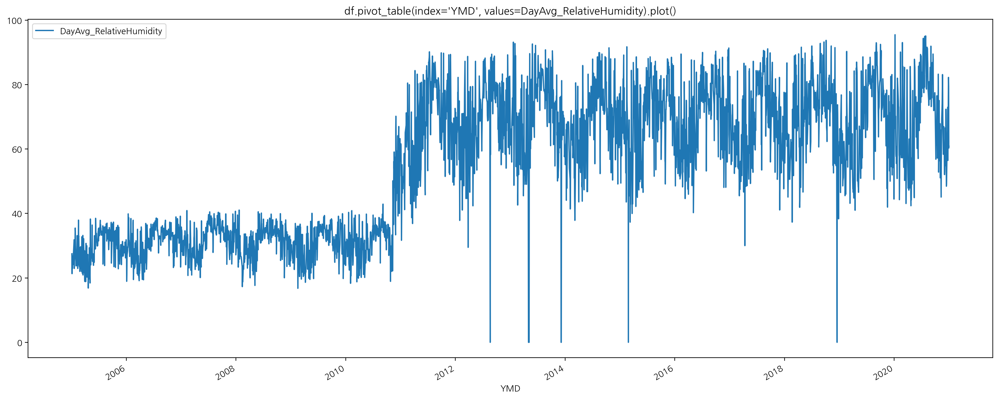

...

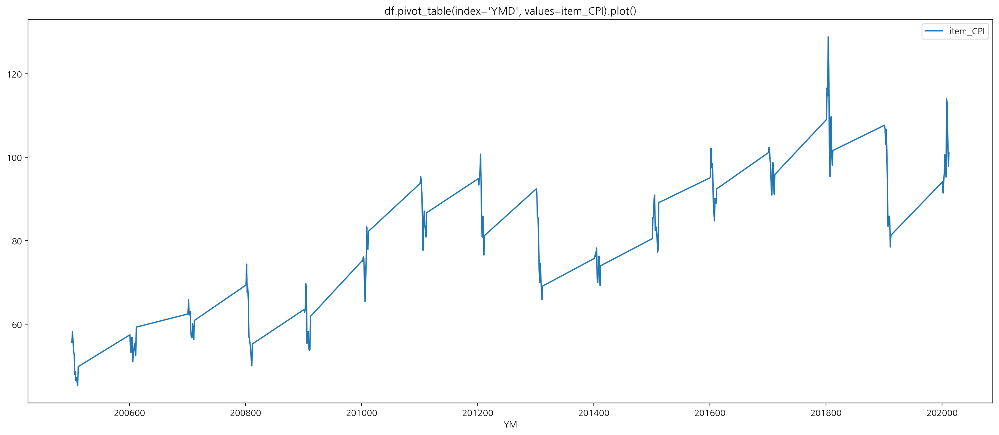

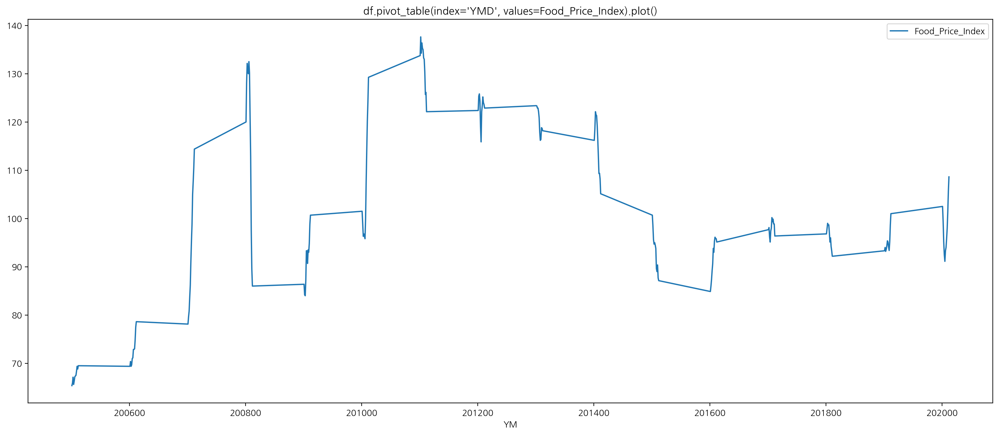

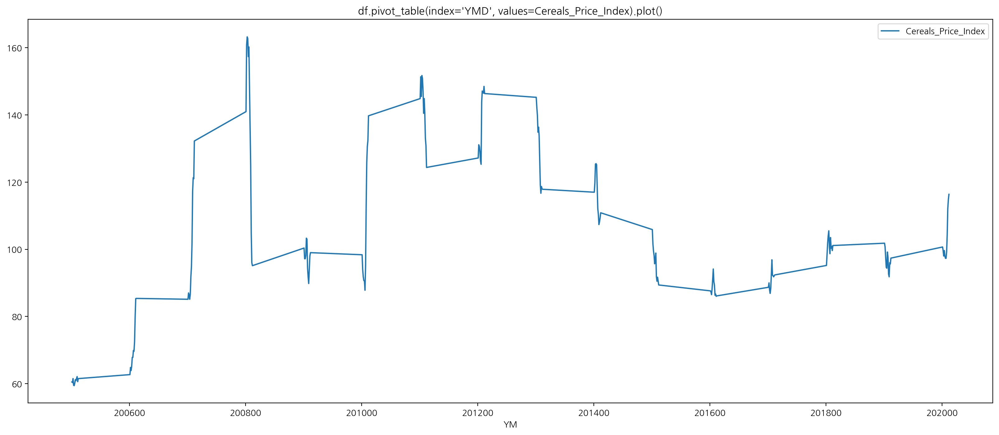

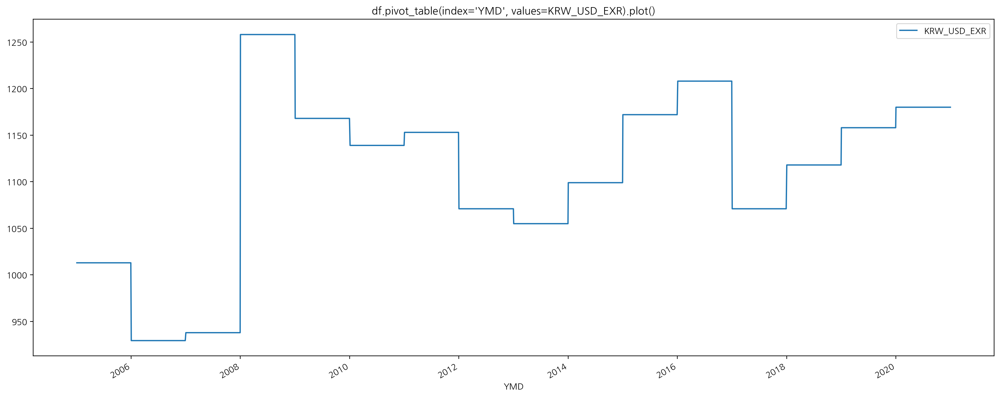

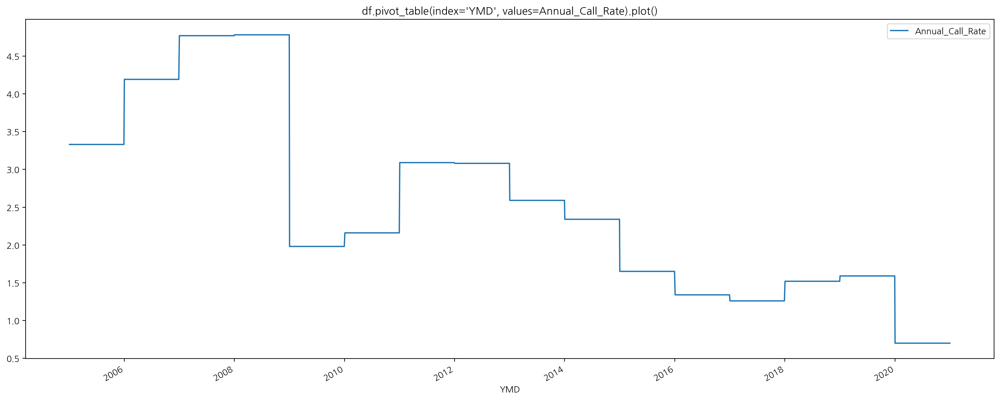

In [17]:
df.pivot_table(index="YMD", values="Price").plot(figsize=(20, 8))

x_day = [
    "Price",
    "DayAvg_Temperature",
    "DayDiff_Temperature",
    "DayAvg_RelativeHumidity",
    "DaySum_Rainfall",
    "DayAvg_WindSpeed",
    "DaySum_Sunshine",
    "Warning_Count",
]
for i in x_day:
    df.pivot_table(index='YMD', values=i).plot(figsize=(20, 8), title=f"""df.pivot_table(index='YMD', values={i}).plot()""")

x_Month = [
    "item_PPI",
    "item_CPI",
    "Food_Price_Index",
    "Cereals_Price_Index",
]
for i in x_Month:
    df.pivot_table(index='YM', values=i).plot(figsize=(20, 8), title=f"""df.pivot_table(index='YMD', values={i}).plot()""")


df["Y"] = df["YMD"].dt.year
x_Year = [
    "KRW_USD_EXR",
    "Annual_Call_Rate",
]
for i in x_Year:
    df.pivot_table(index='YMD', values=i).plot(figsize=(20, 8), title=f"""df.pivot_table(index='YMD', values={i}).plot()""")

# 다변량



┌▣ df.corr() ---- ---- ---- ----


,YM,MD,Price,KRW_USD_EXR,Annual_Call_Rate,item_PPI,item_CPI,Food_Price_Index,Cereals_Price_Index,DayAvg_Temperature,DayDiff_Temperature,DayAvg_RelativeHumidity,DaySum_Rainfall,DayAvg_WindSpeed,DaySum_Sunshine,Warning_Count
YM,1.000,0.003,0.716,0.463,-0.837,0.684,0.747,0.186,0.103,0.016,0.024,0.690,0.035,0.039,0.027,0.405
MD,0.003,1.000,-0.044,0.006,-0.001,0.012,0.037,0.032,0.007,0.262,-0.071,0.149,0.046,-0.174,-0.099,-0.036
Price,0.716,-0.044,1.000,0.347,-0.680,0.926,0.889,0.184,0.080,-0.237,0.067,0.442,-0.047,0.147,0.069,0.300
KRW_USD_EXR,0.463,0.006,0.347,1.000,-0.449,0.320,0.350,0.354,0.351,0.008,0.009,0.240,-0.006,0.048,0.029,0.169
Annual_Call_Rate,-0.837,-0.001,-0.680,-0.449,1.000,-0.653,-0.650,0.040,0.149,-0.012,-0.014,-0.524,-0.031,-0.056,-0.024,-0.342
item_PPI,0.684,0.012,0.926,0.320,-0.653,1.000,0.957,0.181,0.079,-0.035,0.030,0.499,-0.003,0.097,0.090,0.318
item_CPI,0.747,0.037,0.889,0.350,-0.650,0.957,1.000,0.315,0.220,0.022,0.027,0.611,0.012,0.083,0.063,0.338
Food_Price_Index,0.186,0.032,0.184,0.354,0.040,0.181,0.315,1.000,0.959,-0.012,0.001,0.304,0.003,0.079,-0.077,0.090
Cereals_Price_Index,0.103,0.007,0.080,0.351,0.149,0.079,0.220,0.959,1.000,-0.031,0.012,0.218,0.006,0.067,-0.064,0.059
DayAvg_Temperature,0.016,0.262,-0.237,0.008,-0.012,-0.035,0.022,-0.012,-0.031,1.000,-0.033,0.301,0.232,-0.291,0.073,0.076




┌▣ sns.heatmap(data=df.corr(), annot=True, fmt=".2f") ---- ---- ---- ----


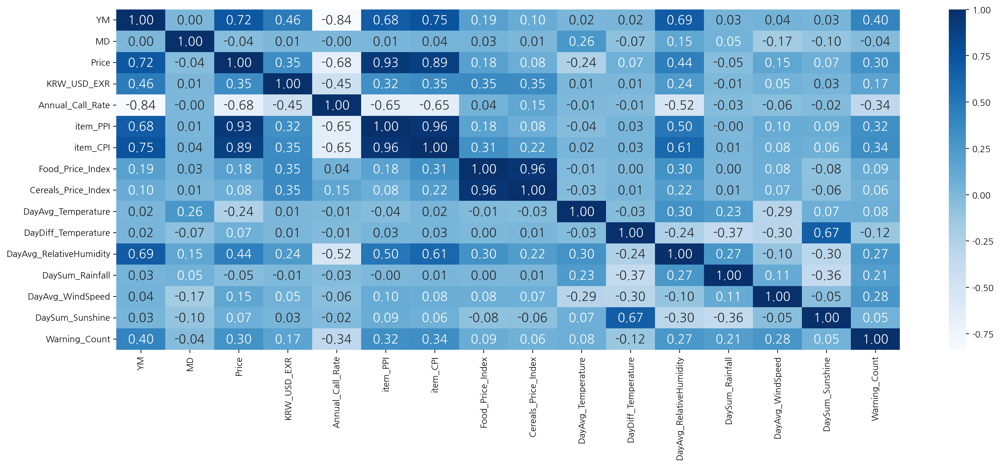

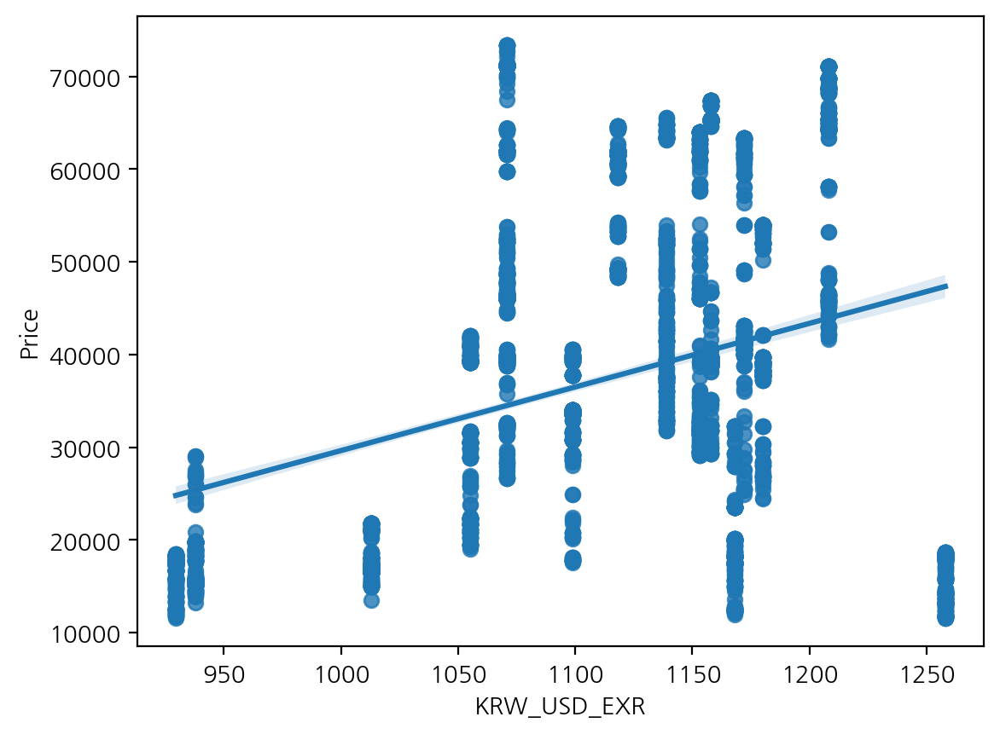

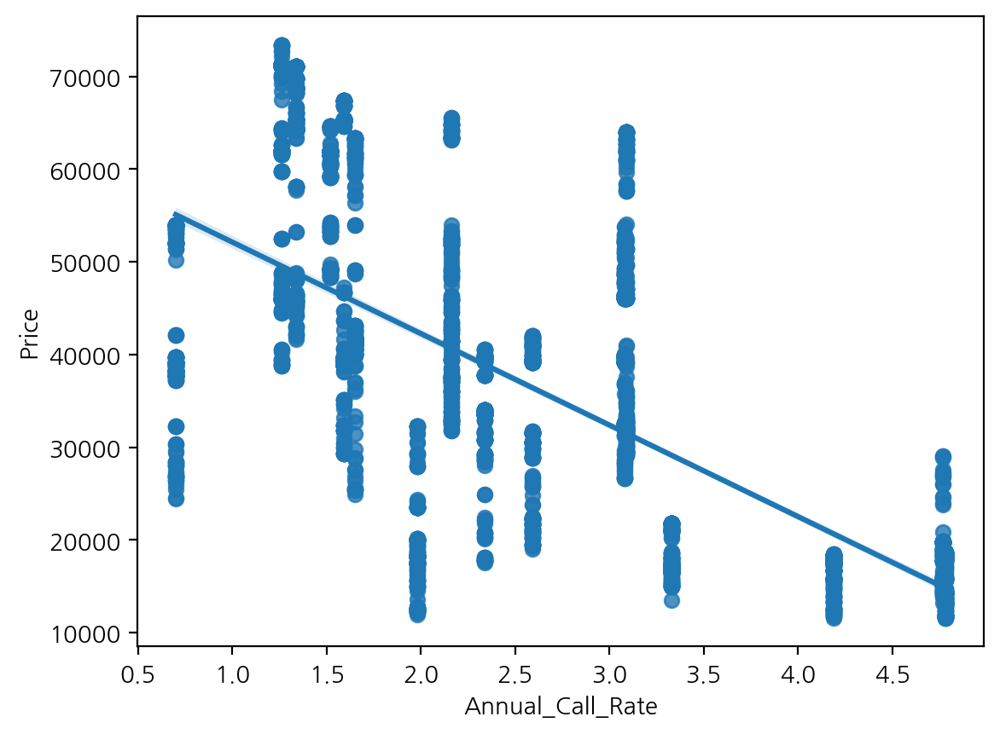

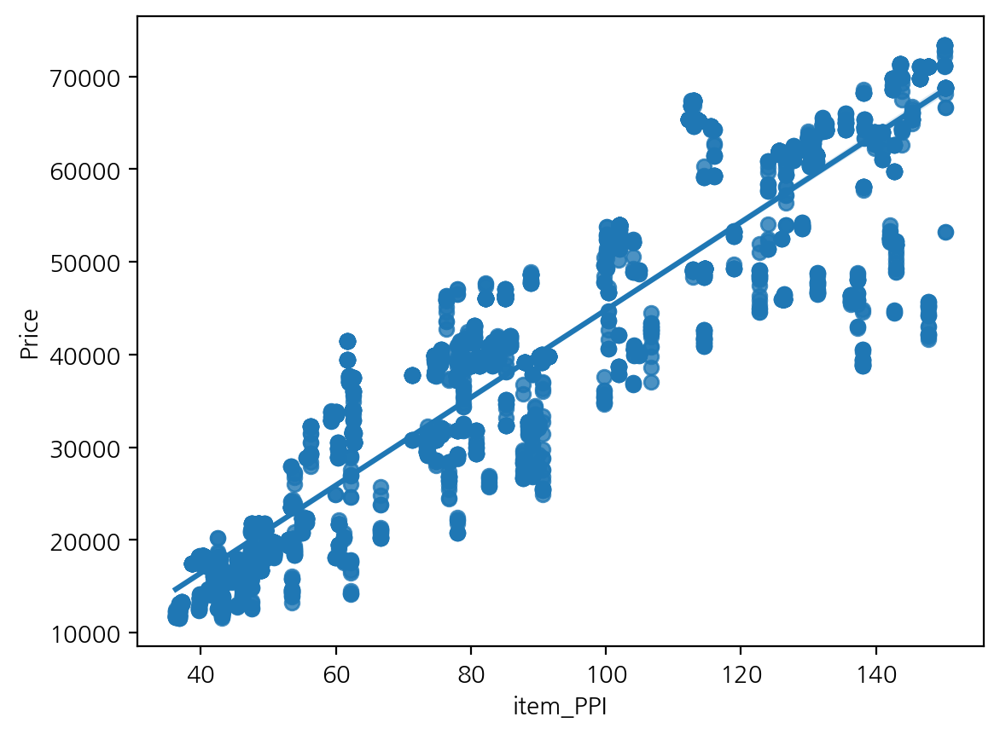

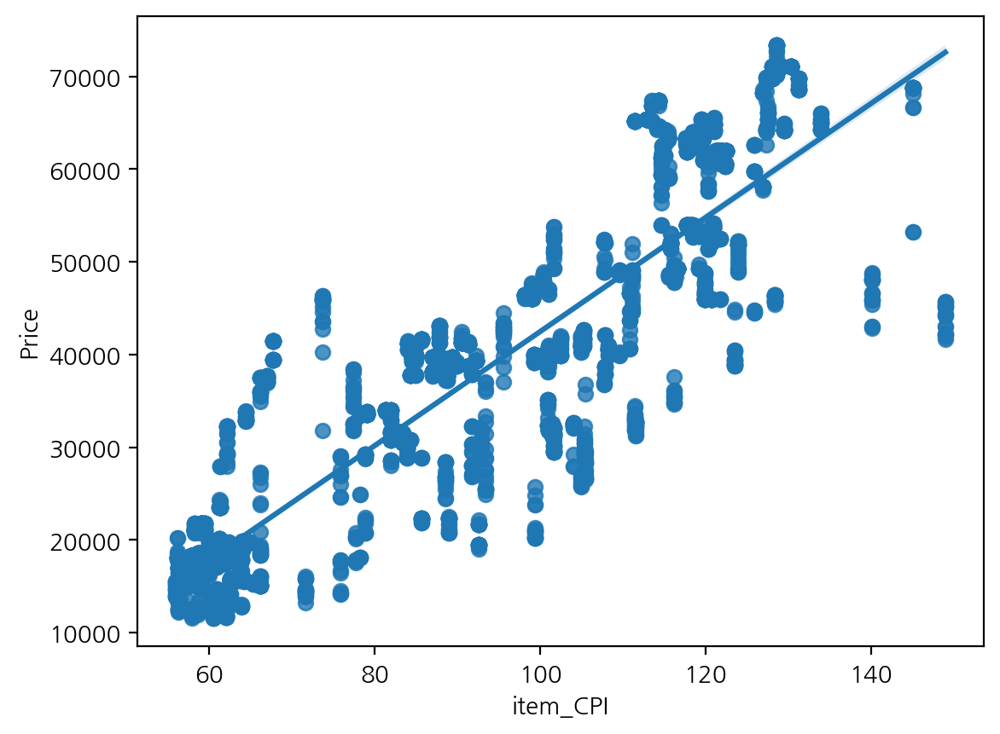

...

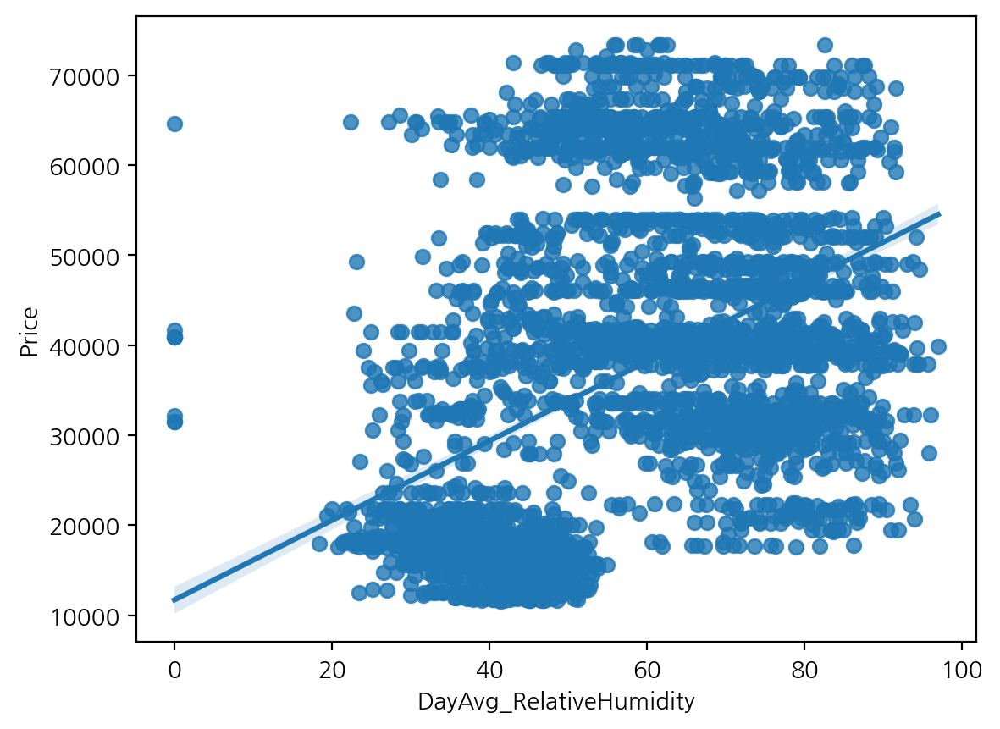

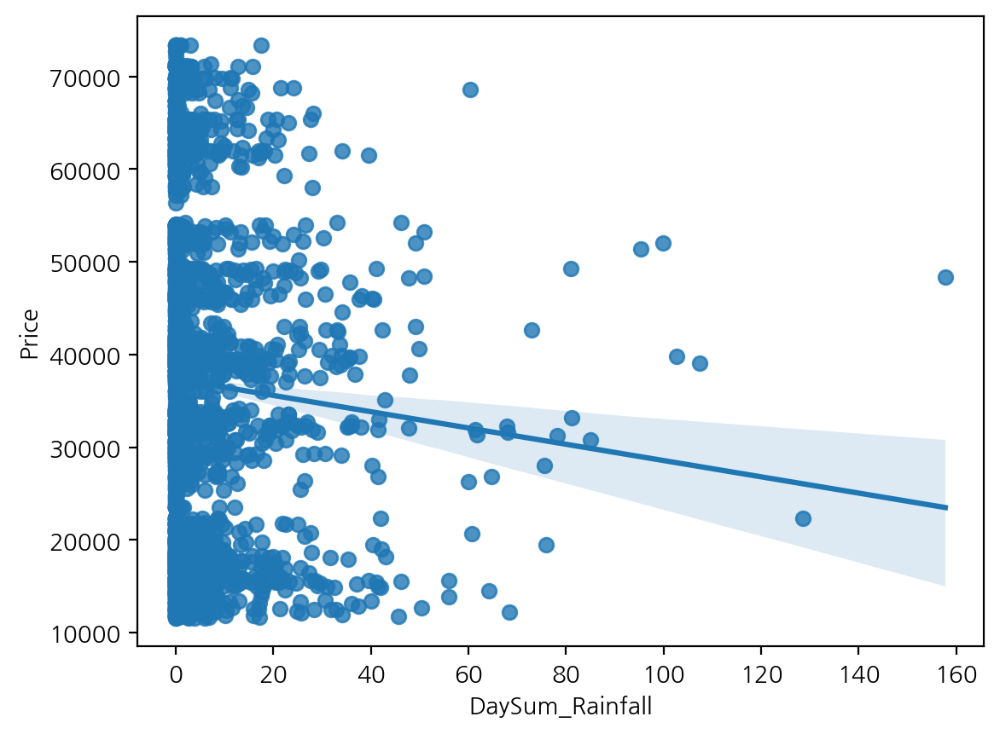

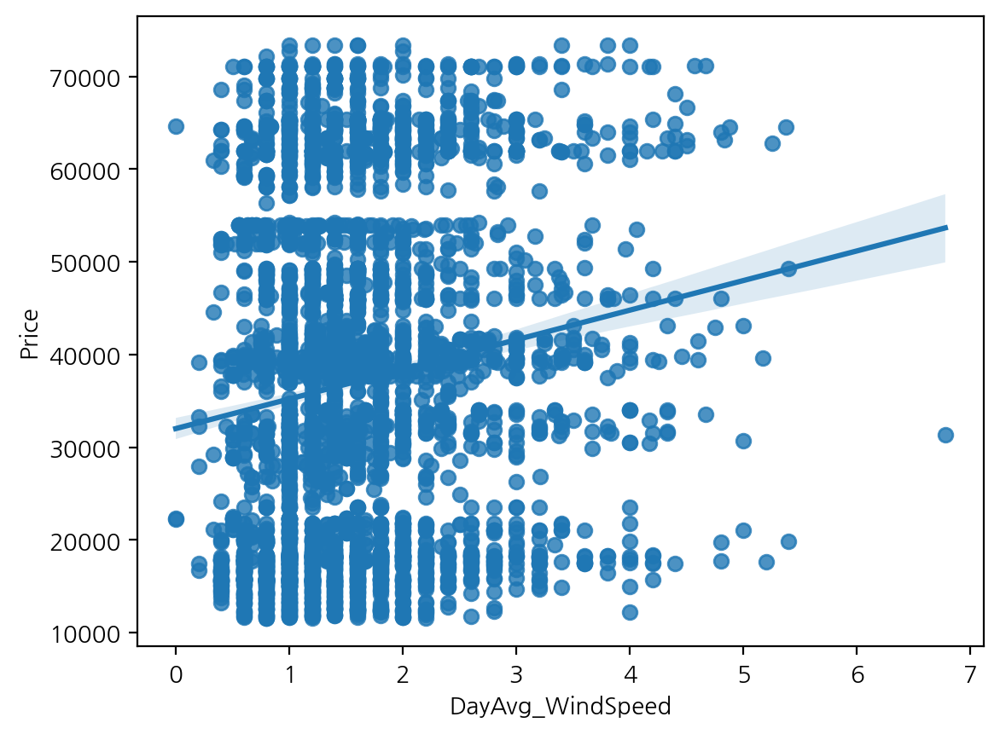

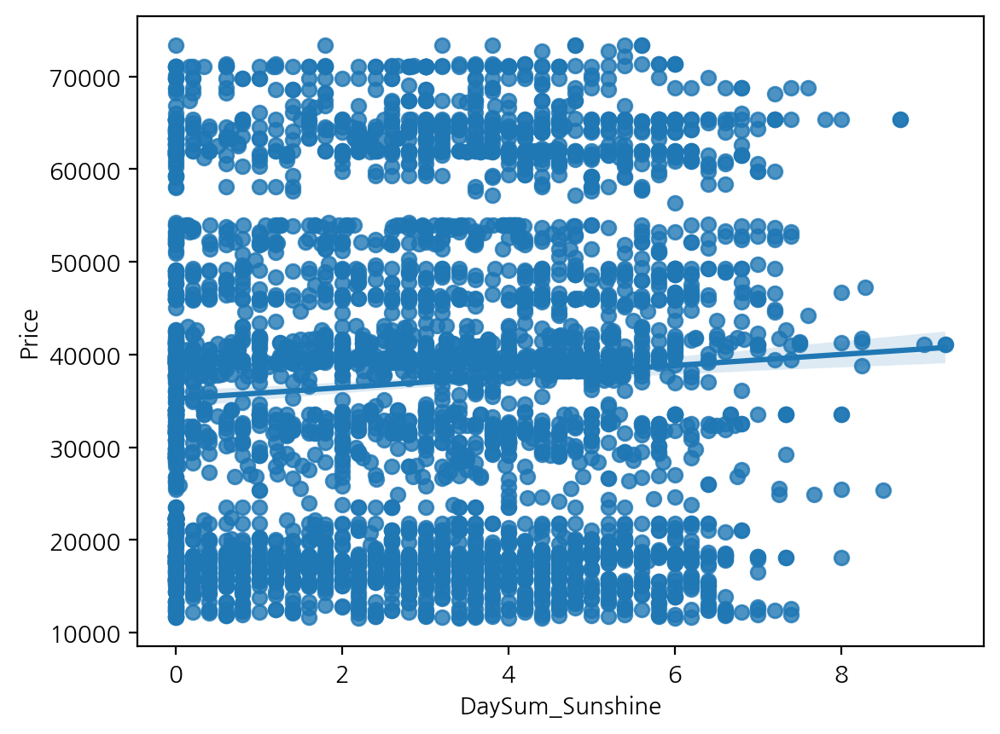

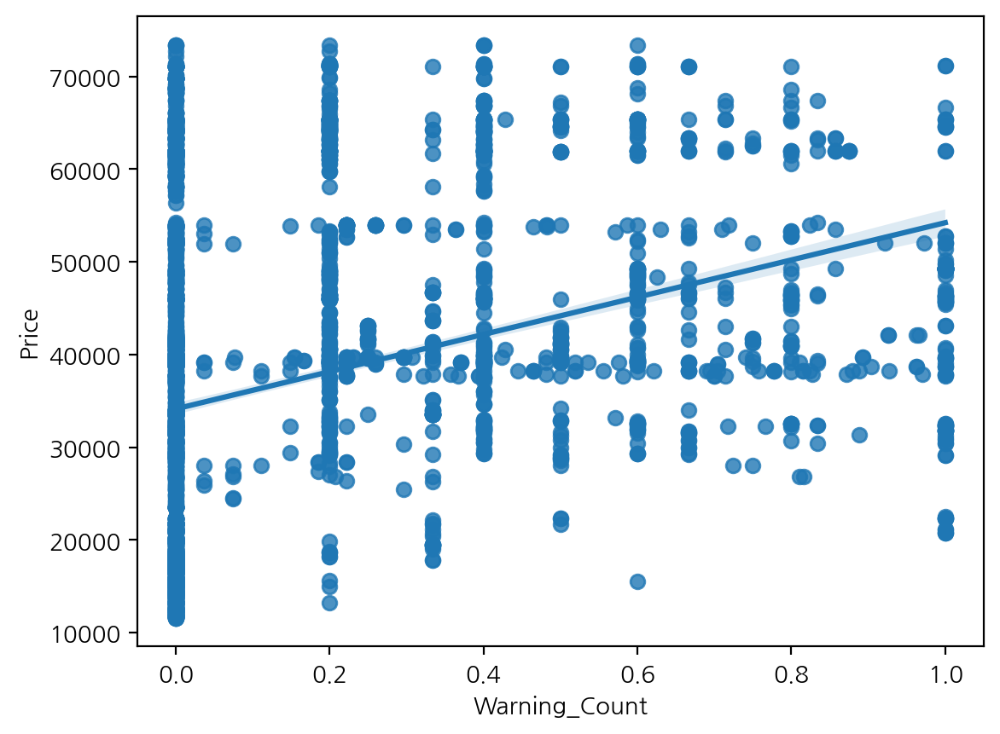

In [18]:
eda.mv()

# 다중공선성 진단

https://mindscale.kr/course/basic-stat-python/13/

## corr

<AxesSubplot: >

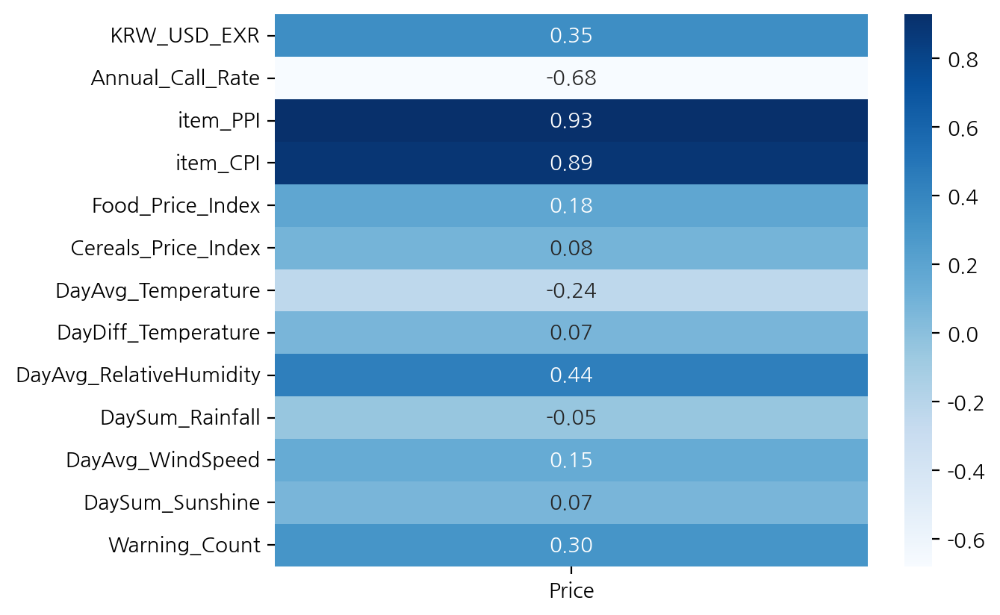

In [19]:
df = df_raw.copy()
df = df[df["Product"] == Product]

c = [
    "KRW_USD_EXR",
    "Annual_Call_Rate",
    "item_PPI",
    "item_CPI",
    "Food_Price_Index",
    "Cereals_Price_Index",
    "DayAvg_Temperature",
    "DayDiff_Temperature",
    "DayAvg_RelativeHumidity",
    "DaySum_Rainfall",
    "DayAvg_WindSpeed",
    "DaySum_Sunshine",
    "Warning_Count",
]
v = pd.DataFrame(df.corr()["Price"][c])
sns.heatmap(v, annot=True, cmap="Blues", fmt=".2f")

## 분산팽창계수(VIF, Variance Inflation Factor)

In [20]:
df = df_raw.copy()
df = df[df["Product"] == Product]

from statsmodels.formula.api import ols
from statsmodels.stats.outliers_influence import variance_inflation_factor


model = ols('Price ~ item_PPI + item_CPI + Food_Price_Index + Cereals_Price_Index', df)
# model = ols('Price ~ Food_Price_Index + Cereals_Price_Index', df)
# model = ols("Price ~ item_PPI + item_CPI", df)
res = model.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.860
Model:                            OLS   Adj. R-squared:                  0.860
Method:                 Least Squares   F-statistic:                     6080.
Date:                Thu, 05 Jan 2023   Prob (F-statistic):               0.00
Time:                        03:15:22   Log-Likelihood:                -40544.
No. Observations:                3970   AIC:                         8.110e+04
Df Residuals:                    3965   BIC:                         8.113e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept           -6274.3474    745.840     -8.412      0.000   -7736.613   -4812.081
item_PPI              462.5668     11.870     38.969      0.000     439.295     485.839
item_CPI                3.0450     16.466      0.185      0.853     -29.238      35.328
Food_Price_Index      146.2005     21.887      6.680      0.000     103.290     189.111
Cereals_Price_Index   -98.7577     15.987     -6.177      0.000    -130.102     -67.414
==============================================================================
Omnibus:                      226.622   Durbin-Watson:                   0.033
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              381.668
Skew:                          -0.453   Prob(JB):                     1.32e-83
Kurtosis:                       4.219   Cond. No.                     1.39e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.39e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [21]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
pd.DataFrame({'column': column, 'VIF': variance_inflation_factor(model.exog, i)}
             for i, column in enumerate(model.exog_names)
             if column != 'Intercept')

,column,VIF
0,item_PPI,15.278
1,item_CPI,16.016
2,Food_Price_Index,14.675
3,Cereals_Price_Index,14.316
